In [1]:
# # Install with specific versions
# !pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
# !pip install ultralytics -q
# !pip install deep-sort-realtime scikit-learn matplotlib opencv-python pillow numpy pandas supervision -q

In [1]:
# 1. Uninstall the existing, potentially mismatched versions first
!pip uninstall torch torchvision torchaudio -y

# 2. Reinstall the correct, compatible versions from the cu118 index
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

# 3. Now, install the other packages
!pip install ultralytics deep-sort-realtime scikit-learn matplotlib opencv-python pillow numpy pandas supervision yt-dlp -q

Found existing installation: torch 2.6.0+cu124
Uninstalling torch-2.6.0+cu124:
  Successfully uninstalled torch-2.6.0+cu124
Found existing installation: torchvision 0.21.0+cu124
Uninstalling torchvision-0.21.0+cu124:
  Successfully uninstalled torchvision-0.21.0+cu124
Found existing installation: torchaudio 2.6.0+cu124
Uninstalling torchaudio-2.6.0+cu124:
  Successfully uninstalled torchaudio-2.6.0+cu124
Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 81.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 875.6/875.6 kB 40.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 102.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.9/663.9 MB 2.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.9/417.9 MB 4.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 9.7 MB/s eta 0:00:0000:0100:

In [2]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from ultralytics import YOLO
from ultralytics.nn.tasks import DetectionModel
from sklearn.cluster import KMeans
import pandas as pd
from PIL import Image
import os
import warnings
from typing import List, Tuple, Dict, Optional
import yt_dlp

warnings.filterwarnings('ignore')

# Critical PyTorch 2.6+ Fix
print("🔧 Applying PyTorch 2.6+ compatibility fixes...")
torch.serialization.add_safe_globals([
    DetectionModel,
    torch.nn.modules.container.Sequential,
    torch.nn.modules.container.ModuleList,
    torch.nn.modules.activation.SiLU,
    torch.nn.modules.pooling.MaxPool2d,
    torch.nn.modules.conv.Conv2d,
    torch.nn.modules.batchnorm.BatchNorm2d,
    torch.nn.modules.upsampling.Upsample
])
print("✅ PyTorch safe globals configured")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
🔧 Applying PyTorch 2.6+ compatibility fixes...
✅ PyTorch safe globals configured


In [3]:
class FixedEnhancedDetector:
    def __init__(self, model_path='yolov8m.pt', 
                 conf_thresh=0.3, ball_conf_thresh=0.13):
        print(f"🔄 Loading YOLO model: {model_path}")
        
        # Method 1: Using safe_globals context manager
        try:
            with torch.serialization.safe_globals([
                DetectionModel, 
                torch.nn.modules.container.Sequential,
                torch.nn.modules.container.ModuleList
            ]):
                self.model = YOLO(model_path)
                print(f"✅ Model loaded successfully with safe_globals context")
        except Exception as e1:
            print(f"⚠️ Context manager failed: {e1}")
            
            # Method 2: Force weights_only=False (use only if you trust the source)
            try:
                import os
                os.environ['TORCH_FORCE_NO_WEIGHTS_ONLY_LOAD'] = '1'
                self.model = YOLO(model_path)
                print("✅ Model loaded with weights_only=False override")
                del os.environ['TORCH_FORCE_NO_WEIGHTS_ONLY_LOAD']
            except Exception as e2:
                print(f"❌ All loading methods failed: {e2}")
                raise RuntimeError("Could not load YOLO model")
        
        self.conf_thresh = conf_thresh
        self.ball_conf_thresh = ball_conf_thresh
    
    def detect(self, frame: np.ndarray) -> List[Dict]:
        """Enhanced detection with proper filtering"""
        results = self.model(frame, imgsz=640, conf=0.1, iou=0.4, verbose=False)
        detections = []
        
        for r in results:
            if r.boxes is not None:
                for box in r.boxes:
                    x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                    conf = box.conf[0].cpu().numpy()
                    cls = int(box.cls[0].cpu().numpy())
                    
                    w, h = x2 - x1, y2 - y1
                    
                    # Enhanced person detection
                    if cls == 0 and conf >= self.conf_thresh:  # person class
                        if h > 30 and w > 15:  # minimum size
                            aspect_ratio = h / w
                            if 1.2 <= aspect_ratio <= 4.0:  # reasonable person proportions
                                detections.append({
                                    'bbox': [float(x1), float(y1), float(x2), float(y2)],
                                    'confidence': float(conf),
                                    'class_id': cls,
                                    'class_name': 'person'
                                })
                    
                    # Enhanced ball detection
                    elif cls == 32 and conf >= self.ball_conf_thresh:  # sports ball class
                        if w <= 50 and h <= 50:  # reasonable ball size
                            aspect_ratio = max(w, h) / min(w, h) if min(w, h) > 0 else float('inf')
                            if aspect_ratio <= 2.0:  # roughly circular
                                detections.append({
                                    'bbox': [float(x1), float(y1), float(x2), float(y2)],
                                    'confidence': float(conf),
                                    'class_id': cls,
                                    'class_name': 'ball'
                                })
        
        return detections


In [4]:
CONFIG = {
    'yolo_model_path': 'yolov8m.pt',
    'confidence_threshold': 0.3,
    'ball_confidence_threshold': 0.13,
    'nms_threshold': 0.4,
}

COLORS = {
    'team1': (0, 0, 255),      # Red
    'team2': (255, 0, 0),      # Blue
    'referee': (0, 255, 0),    # Green
    'ball': (0, 255, 255),     # Yellow
    'unknown': (128, 128, 128) # Gray
}

class Utils:
    @staticmethod
    def get_bbox_center(bbox):
        x1, y1, x2, y2 = bbox
        return ((x1 + x2) / 2, y2)  # Bottom center for foot position
    
    @staticmethod
    def draw_text_background(img, text, pos, font_scale=0.6, color=(255,255,255), bg_color=(0,0,0)):
        font = cv2.FONT_HERSHEY_SIMPLEX
        thickness = 2
        (tw, th), baseline = cv2.getTextSize(text, font, font_scale, thickness)
        cv2.rectangle(img, (pos[0], pos[1]-th-baseline), (pos[0]+tw, pos[1]+baseline), bg_color, -1)
        cv2.putText(img, text, pos, font, font_scale, color, thickness)
        return img


In [5]:
class SimpleTracker:
    def __init__(self):
        self.next_id = 0
        self.objects = {}
        self.disappeared = {}
        self.max_disappeared = 30
        
    def update(self, detections):
        if not detections:
            self._handle_disappeared()
            return []
        
        person_detections = [d for d in detections if d['class_name'] == 'person']
        input_centroids = [Utils.get_bbox_center(d['bbox']) for d in person_detections]
        
        if len(self.objects) == 0:
            for i, det in enumerate(person_detections):
                self.objects[self.next_id] = input_centroids[i]
                self.disappeared[self.next_id] = 0
                self.next_id += 1
        else:
            self._update_existing(input_centroids, person_detections)
        
        # Create tracked detections
        tracked = []
        for obj_id, centroid in self.objects.items():
            for det in person_detections:
                det_center = Utils.get_bbox_center(det['bbox'])
                if abs(det_center[0] - centroid[0]) < 50 and abs(det_center[1] - centroid[1]) < 50:
                    tracked.append({
                        **det,
                        'track_id': obj_id,
                        'team': 'team1' if obj_id % 2 == 0 else 'team2'  # Simple team assignment
                    })
                    break
        
        # Add balls
        tracked.extend([d for d in detections if d['class_name'] == 'ball'])
        return tracked
    
    def _update_existing(self, input_centroids, detections):
        # Simple distance-based matching
        object_ids = list(self.objects.keys())
        for obj_id in object_ids:
            if input_centroids:
                # Find closest centroid
                distances = [np.linalg.norm(np.array(self.objects[obj_id]) - np.array(c)) 
                           for c in input_centroids]
                min_idx = np.argmin(distances)
                if distances[min_idx] < 100:  # threshold
                    self.objects[obj_id] = input_centroids[min_idx]
                    self.disappeared[obj_id] = 0
                    input_centroids.pop(min_idx)
                else:
                    self.disappeared[obj_id] += 1
            else:
                self.disappeared[obj_id] += 1
        
        # Register new objects
        for centroid in input_centroids:
            self.objects[self.next_id] = centroid
            self.disappeared[self.next_id] = 0
            self.next_id += 1
        
        self._handle_disappeared()
    
    def _handle_disappeared(self):
        for obj_id in list(self.disappeared.keys()):
            if self.disappeared[obj_id] > self.max_disappeared:
                del self.objects[obj_id]
                del self.disappeared[obj_id]


In [23]:
# class FixedFootballAnalyzer:
#     def __init__(self):
#         self.detector = FixedEnhancedDetector()
#         self.tracker = SimpleTracker()
#         self.initialized = False
        
#         # FIXED: Use exact dimensions expected by main processing
#         self.canvas_width = 800   # Must match expected width
#         self.canvas_height = 600  # Must match expected height
        
#         # FIFA standard dimensions (scaled to fit 800x600)
#         self.pitch_width = 700   # Playable area width
#         self.pitch_height = 460  # Playable area height
        
#         # Calculate all field markings based on FIFA standards
#         self._calculate_field_dimensions()
        
#     def _calculate_field_dimensions(self):
#         """Calculate all field dimensions based on FIFA standards"""
#         # Field boundaries (centered in 800x600 canvas)
#         self.field_left = 50
#         self.field_right = self.field_left + self.pitch_width
#         self.field_top = 70
#         self.field_bottom = self.field_top + self.pitch_height
#         self.field_center_x = self.field_left + self.pitch_width // 2
#         self.field_center_y = self.field_top + self.pitch_height // 2
        
#         # FIFA standard proportions scaled to our dimensions
#         # Goal: 7.32m wide (proportion: 7.32/68 ≈ 0.108)
#         self.goal_width = int(self.pitch_height * 0.24)  # Adjusted for visibility
#         self.goal_depth = 12
        
#         # Penalty area: 40.32m wide × 16.5m deep  
#         self.penalty_area_width = int(self.pitch_width * 0.37)  # 40.32/105
#         self.penalty_area_height = int(self.pitch_height * 0.36)  # 16.5/68
        
#         # Goal area: 18.32m wide × 5.5m deep
#         self.goal_area_width = int(self.pitch_width * 0.17)  # 18.32/105
#         self.goal_area_height = int(self.pitch_height * 0.13)  # 5.5/68
        
#         # Center circle: 9.15m radius
#         self.center_circle_radius = int(min(self.pitch_width, self.pitch_height) * 0.10)
        
#         # Corner arc: 1m radius
#         self.corner_arc_radius = 12
        
#         # Penalty spot: 11m from goal line
#         self.penalty_spot_distance = int(self.pitch_width * 0.105)  # 11/105
        
#     def process_frame(self, frame):
#         try:
#             # Detect objects
#             detections = self.detector.detect(frame)
            
#             # Track objects
#             tracked_detections = self.tracker.update(detections)
            
#             # Create annotated frame
#             annotated_frame = self._annotate_frame(frame.copy(), tracked_detections)
            
#             # Create realistic bird's eye view with CORRECT dimensions
#             birds_eye_view = self._create_realistic_pitch(tracked_detections, frame.shape)
            
#             # Generate statistics
#             stats = self._generate_stats(tracked_detections)
            
#             return annotated_frame, birds_eye_view, stats
            
#         except Exception as e:
#             print(f"Error processing frame: {e}")
#             return frame, self._create_empty_pitch(), {
#                 'total_players': 0, 'team1_players': 0, 'team2_players': 0,
#                 'ball_detected': False
#             }
    
#     def _annotate_frame(self, frame, detections):
#         for det in detections:
#             x1, y1, x2, y2 = map(int, det['bbox'])
            
#             if det['class_name'] == 'ball':
#                 color = COLORS['ball']
#                 label = f"Ball ({det['confidence']:.2f})"
#             else:
#                 team = det.get('team', 'unknown')
#                 color = COLORS.get(team, COLORS['unknown'])
#                 track_id = det.get('track_id', 'N/A')
#                 label = f"ID:{track_id} {team}"
            
#             # Draw bounding box
#             cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
            
#             # Draw label
#             Utils.draw_text_background(frame, label, (x1, y1-10), color=(255,255,255), bg_color=color)
        
#         return frame
    
#     def _draw_realistic_pitch(self, field):
#         """Draw a FIFA-standard football pitch that matches your reference image"""
        
#         # 1. Field outline (main rectangle)
#         cv2.rectangle(field, (self.field_left, self.field_top), 
#                      (self.field_right, self.field_bottom), (255, 255, 255), 3)
        
#         # 2. Center line (vertical line through middle)
#         cv2.line(field, (self.field_center_x, self.field_top), 
#                 (self.field_center_x, self.field_bottom), (255, 255, 255), 3)
        
#         # 3. Center circle
#         cv2.circle(field, (self.field_center_x, self.field_center_y), 
#                   self.center_circle_radius, (255, 255, 255), 3)
#         cv2.circle(field, (self.field_center_x, self.field_center_y), 4, (255, 255, 255), -1)
        
#         # 4. Calculate goal positions
#         goal_top = self.field_center_y - self.goal_width // 2
#         goal_bottom = self.field_center_y + self.goal_width // 2
        
#         # 5. Goals (extending outside the field)
#         # Left goal
#         cv2.rectangle(field, (self.field_left - self.goal_depth, goal_top), 
#                      (self.field_left, goal_bottom), (255, 255, 255), 3)
        
#         # Right goal  
#         cv2.rectangle(field, (self.field_right, goal_top), 
#                      (self.field_right + self.goal_depth, goal_bottom), (255, 255, 255), 3)
        
#         # 6. Penalty areas (18-yard boxes)
#         penalty_top = self.field_center_y - self.penalty_area_height // 2
#         penalty_bottom = self.field_center_y + self.penalty_area_height // 2
        
#         # Left penalty area
#         cv2.rectangle(field, (self.field_left, penalty_top), 
#                      (self.field_left + self.penalty_area_width, penalty_bottom), 
#                      (255, 255, 255), 3)
        
#         # Right penalty area
#         cv2.rectangle(field, (self.field_right - self.penalty_area_width, penalty_top), 
#                      (self.field_right, penalty_bottom), (255, 255, 255), 3)
        
#         # 7. Goal areas (6-yard boxes)
#         goal_area_top = self.field_center_y - self.goal_area_height // 2
#         goal_area_bottom = self.field_center_y + self.goal_area_height // 2
        
#         # Left goal area
#         cv2.rectangle(field, (self.field_left, goal_area_top), 
#                      (self.field_left + self.goal_area_width, goal_area_bottom), 
#                      (255, 255, 255), 2)
        
#         # Right goal area
#         cv2.rectangle(field, (self.field_right - self.goal_area_width, goal_area_top), 
#                      (self.field_right, goal_area_bottom), (255, 255, 255), 2)
        
#         # 8. Penalty spots
#         left_penalty_x = self.field_left + self.penalty_spot_distance
#         right_penalty_x = self.field_right - self.penalty_spot_distance
        
#         cv2.circle(field, (left_penalty_x, self.field_center_y), 4, (255, 255, 255), -1)
#         cv2.circle(field, (right_penalty_x, self.field_center_y), 4, (255, 255, 255), -1)
        
#         # 9. Penalty arcs (D-shaped areas outside penalty boxes)
#         arc_radius = self.center_circle_radius
#         cv2.ellipse(field, (left_penalty_x, self.field_center_y), 
#                    (arc_radius, arc_radius), 0, -65, 65, (255, 255, 255), 2)
#         cv2.ellipse(field, (right_penalty_x, self.field_center_y), 
#                    (arc_radius, arc_radius), 0, 115, 245, (255, 255, 255), 2)
        
#         # 10. Corner arcs
#         # Top-left corner
#         cv2.ellipse(field, (self.field_left, self.field_top), 
#                    (self.corner_arc_radius, self.corner_arc_radius), 0, 0, 90, (255, 255, 255), 2)
        
#         # Top-right corner
#         cv2.ellipse(field, (self.field_right, self.field_top), 
#                    (self.corner_arc_radius, self.corner_arc_radius), 0, 90, 180, (255, 255, 255), 2)
        
#         # Bottom-left corner
#         cv2.ellipse(field, (self.field_left, self.field_bottom), 
#                    (self.corner_arc_radius, self.corner_arc_radius), 0, 270, 360, (255, 255, 255), 2)
        
#         # Bottom-right corner
#         cv2.ellipse(field, (self.field_right, self.field_bottom), 
#                    (self.corner_arc_radius, self.corner_arc_radius), 0, 180, 270, (255, 255, 255), 2)
        
#         return field
    
#     def _create_realistic_pitch(self, detections, frame_shape):
#         """Create a realistic football pitch with EXACT 800x600 dimensions"""
        
#         # IMPORTANT: Create field with exact expected dimensions
#         field = np.zeros((self.canvas_height, self.canvas_width, 3), dtype=np.uint8)
#         field[:, :] = (34, 139, 34)  # FIFA green color
        
#         # Draw the complete pitch
#         field = self._draw_realistic_pitch(field)
        
#         # Map detections to field
#         for det in detections:
#             center = Utils.get_bbox_center(det['bbox'])
#             field_pos = self._map_to_field_coordinates(center, frame_shape)
            
#             if det['class_name'] == 'ball':
#                 self._draw_ball(field, field_pos)
#             else:
#                 team = det.get('team', 'unknown')
#                 track_id = det.get('track_id', 'N/A')
#                 self._draw_player(field, field_pos, team, track_id)
        
#         # Add match information at the top
#         self._add_match_info(field, detections)
        
#         return field
    
#     def _map_to_field_coordinates(self, point, frame_shape):
#         """Map real coordinates to field coordinates"""
#         frame_height, frame_width = frame_shape[:2]
        
#         # Normalize coordinates
#         norm_x = point[0] / frame_width
#         norm_y = point[1] / frame_height
        
#         # Map to field coordinates
#         field_x = int(self.field_left + (self.field_right - self.field_left) * norm_x)
#         field_y = int(self.field_top + (self.field_bottom - self.field_top) * norm_y)
        
#         # Ensure within bounds
#         field_x = max(self.field_left + 5, min(self.field_right - 5, field_x))
#         field_y = max(self.field_top + 5, min(self.field_bottom - 5, field_y))
        
#         return (field_x, field_y)
    
#     def _draw_ball(self, field, position):
#         """Draw realistic ball"""
#         x, y = position
#         # White ball
#         cv2.circle(field, (x, y), 8, (255, 255, 255), -1)
#         cv2.circle(field, (x, y), 10, (0, 0, 0), 2)
        
#     def _draw_player(self, field, position, team, track_id):
#         """Draw player representation matching your reference image style"""
#         x, y = position
        
#         # Team colors similar to your reference
#         team_colors = {
#             'team1': (0, 0, 255),      # Red (like Brazil)
#             'team2': (255, 255, 255),  # White (like Germany)  
#             'referee': (255, 255, 0),  # Yellow
#             'unknown': (128, 128, 128) # Gray
#         }
        
#         color = team_colors.get(team, team_colors['unknown'])
        
#         # Player circle
#         cv2.circle(field, (x, y), 10, color, -1)
#         cv2.circle(field, (x, y), 12, (0, 0, 0), 2)  # Black outline
        
#         # Player number (if available)
#         if track_id != 'N/A':
#             cv2.putText(field, str(track_id), (x - 6, y + 3), 
#                        cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 0, 0), 1)
    
#     def _add_match_info(self, field, detections):
#         """Add match information similar to your reference image"""
#         # Count players
#         team1_count = sum(1 for det in detections 
#                          if det['class_name'] == 'person' and det.get('team') == 'team1')
#         team2_count = sum(1 for det in detections 
#                          if det['class_name'] == 'person' and det.get('team') == 'team2')
#         ball_detected = any(det['class_name'] == 'ball' for det in detections)
        
#         # Add info at top (similar to your reference)
#         info_lines = [
#             f"Players: {len([d for d in detections if d['class_name'] == 'person'])}",
#             f"Team 1: {team1_count}  Team 2: {team2_count}",
#             f"Ball: {'✓' if ball_detected else '✗'}"
#         ]
        
#         for i, line in enumerate(info_lines):
#             cv2.putText(field, line, (10, 25 + i * 20), 
#                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
    
#     def _create_empty_pitch(self):
#         """Create empty realistic pitch with EXACT dimensions"""
#         field = np.zeros((self.canvas_height, self.canvas_width, 3), dtype=np.uint8)
#         field[:, :] = (34, 139, 34)
#         field = self._draw_realistic_pitch(field)
#         return field
    
#     def _generate_stats(self, detections):
#         stats = {'total_players': 0, 'team1_players': 0, 'team2_players': 0, 'ball_detected': False}
        
#         for det in detections:
#             if det['class_name'] == 'person':
#                 stats['total_players'] += 1
#                 team = det.get('team', 'unknown')
#                 if team == 'team1':
#                     stats['team1_players'] += 1
#                 elif team == 'team2':
#                     stats['team2_players'] += 1
#             elif det['class_name'] == 'ball':
#                 stats['ball_detected'] = True
        
#         return stats


In [25]:
class FixedFootballAnalyzer:
    def __init__(self):
        self.detector = FixedEnhancedDetector()
        self.tracker = SimpleTracker()
        self.initialized = False
        
    def process_frame(self, frame):
        try:
            # Detect objects
            detections = self.detector.detect(frame)
            
            # Track objects
            tracked_detections = self.tracker.update(detections)
            
            # Create annotated frame
            annotated_frame = self._annotate_frame(frame.copy(), tracked_detections)
            
            # Create simple bird's eye view
            birds_eye_view = self._create_birds_eye_view(tracked_detections)
            
            # Generate statistics
            stats = self._generate_stats(tracked_detections)
            
            return annotated_frame, birds_eye_view, stats
            
        except Exception as e:
            print(f"Error processing frame: {e}")
            # Return original frame and empty stats on error
            return frame, self._create_empty_birds_eye_view(), {
                'total_players': 0, 'team1_players': 0, 'team2_players': 0,
                'ball_detected': False
            }
    
    def _annotate_frame(self, frame, detections):
        for det in detections:
            x1, y1, x2, y2 = map(int, det['bbox'])
            
            if det['class_name'] == 'ball':
                color = COLORS['ball']
                label = f"Ball ({det['confidence']:.2f})"
            else:
                team = det.get('team', 'unknown')
                color = COLORS.get(team, COLORS['unknown'])
                track_id = det.get('track_id', 'N/A')
                label = f"ID:{track_id} {team}"
            
            # Draw bounding box
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
            
            # Draw label
            Utils.draw_text_background(frame, label, (x1, y1-10), color=(255,255,255), bg_color=color)
        
        return frame
    
    def _create_birds_eye_view(self, detections):
        # Create simple top-down view (800x600 green field)
        field = np.zeros((600, 800, 3), dtype=np.uint8)
        field[:, :] = (34, 139, 34)  # Green field
        
        # Draw field lines
        cv2.rectangle(field, (50, 50), (750, 550), (255, 255, 255), 2)
        cv2.line(field, (400, 50), (400, 550), (255, 255, 255), 2)
        cv2.circle(field, (400, 300), 50, (255, 255, 255), 2)
        
        # Map detections to field (simple mapping)
        for det in detections:
            center = Utils.get_bbox_center(det['bbox'])
            # Simple mapping: normalize to field coordinates
            field_x = int((center[0] / 1920) * 700 + 50) if center[0] < 1920 else 400
            field_y = int((center[1] / 1080) * 500 + 50) if center[1] < 1080 else 300
            
            if det['class_name'] == 'ball':
                cv2.circle(field, (field_x, field_y), 8, COLORS['ball'], -1)
            else:
                team = det.get('team', 'unknown')
                color = COLORS.get(team, COLORS['unknown'])
                cv2.circle(field, (field_x, field_y), 12, color, -1)
                cv2.circle(field, (field_x, field_y), 15, (255, 255, 255), 2)
                
                if 'track_id' in det:
                    cv2.putText(field, str(det['track_id']), (field_x+20, field_y+5),
                              cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
        
        return field
    
    def _create_empty_birds_eye_view(self):
        field = np.zeros((600, 800, 3), dtype=np.uint8)
        field[:, :] = (34, 139, 34)
        cv2.rectangle(field, (50, 50), (750, 550), (255, 255, 255), 2)
        cv2.line(field, (400, 50), (400, 550), (255, 255, 255), 2)
        cv2.circle(field, (400, 300), 50, (255, 255, 255), 2)
        return field
    
    def _generate_stats(self, detections):
        stats = {'total_players': 0, 'team1_players': 0, 'team2_players': 0, 'ball_detected': False}
        
        for det in detections:
            if det['class_name'] == 'person':
                stats['total_players'] += 1
                team = det.get('team', 'unknown')
                if team == 'team1':
                    stats['team1_players'] += 1
                elif team == 'team2':
                    stats['team2_players'] += 1
            elif det['class_name'] == 'ball':
                stats['ball_detected'] = True
        
        return stats


In [7]:
# def process_video_fixed(video_path, output_path=None, max_frames=200):
#     """Fixed video processing with PyTorch compatibility"""
    
#     cap = cv2.VideoCapture(video_path)
#     if not cap.isOpened():
#         print(f"❌ Cannot open video: {video_path}")
#         return
    
#     fps = int(cap.get(cv2.CAP_PROP_FPS))
#     width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
#     height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
#     total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
#     print(f"📹 Video: {width}x{height}, {fps} FPS, {total_frames} frames")
    
#     # Initialize analyzer
#     analyzer = FixedFootballAnalyzer()
    
#     # Setup output if requested
#     if output_path:
#         fourcc = cv2.VideoWriter_fourcc(*'mp4v')
#         combined_width = width + 800  # original + bird's eye view
#         combined_height = max(height, 600)
#         writer = cv2.VideoWriter(output_path, fourcc, fps, (combined_width, combined_height))
#     else:
#         writer = None
    
#     frame_count = 0
#     stats_history = []
    
#     print("🔄 Processing video...")
    
#     try:
#         while frame_count < max_frames:
#             ret, frame = cap.read()
#             if not ret:
#                 break
            
#             # Process frame
#             annotated_frame, birds_eye_view, stats = analyzer.process_frame(frame)
#             stats_history.append(stats)
            
#             # Add stats to bird's eye view
#             stats_text = [
#                 f"Frame: {frame_count + 1}/{max_frames}",
#                 f"Players: {stats['total_players']}",
#                 f"Team 1: {stats['team1_players']} | Team 2: {stats['team2_players']}",
#                 f"Ball: {'✓' if stats['ball_detected'] else '✗'}"
#             ]
            
#             for i, text in enumerate(stats_text):
#                 y_pos = 30 + i * 30
#                 cv2.rectangle(birds_eye_view, (10, y_pos - 20), (300, y_pos + 10), (0, 0, 0), -1)
#                 cv2.putText(birds_eye_view, text, (15, y_pos), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
            
#             # Create combined output
#             if writer:
#                 combined = np.zeros((combined_height, combined_width, 3), dtype=np.uint8)
#                 combined[:height, :width] = cv2.resize(annotated_frame, (width, height))
#                 combined[:600, width:width+800] = birds_eye_view
                
#                 # Add titles
#                 cv2.putText(combined, "Original View", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 255), 2)
#                 cv2.putText(combined, "Bird's Eye View", (width + 10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 255), 2)
                
#                 writer.write(combined)
            
#             # Show progress
#             if frame_count % 50 == 0:
#                 progress = (frame_count + 1) / max_frames * 100
#                 print(f"Progress: {progress:.1f}% - Frame {frame_count + 1}")
                
#                 # Display sample
#                 fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
#                 ax1.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
#                 ax1.set_title(f'Annotated Frame {frame_count + 1}')
#                 ax1.axis('off')
                
#                 ax2.imshow(cv2.cvtColor(birds_eye_view, cv2.COLOR_BGR2RGB))
#                 ax2.set_title(f'Bird\'s Eye View {frame_count + 1}')
#                 ax2.axis('off')
                
#                 plt.tight_layout()
#                 plt.show()
            
#             frame_count += 1
    
#     except KeyboardInterrupt:
#         print("\n⏹️ Processing interrupted")
    
#     finally:
#         cap.release()
#         if writer:
#             writer.release()
        
#         print(f"✅ Processing complete! Processed {frame_count} frames")
#         if output_path:
#             print(f"📁 Output saved: {output_path}")

# def run_fixed_analysis():
#     """Main function to run the fixed analysis"""
#     print("=== Fixed Football Analysis System ===")
    
#     video_path = "/kaggle/input/football-video3/match.mp4"
#     output_path = "fixed_analysis_output.mp4"
    
#     if os.path.exists(video_path):
#         print(f"✅ Video found: {video_path}")
#         try:
#             process_video_fixed(video_path, output_path, max_frames=1000)
#             print("✅ Analysis completed successfully!")
#         except Exception as e:
#             print(f"❌ Error: {e}")
#     else:
#         print(f"❌ Video not found: {video_path}")
#         print("Please update the video path")

# print("🏈 Fixed Football Analysis System Ready!")
# print("Run: run_fixed_analysis()")


🏈 Fixed Football Analysis System Ready!
Run: run_fixed_analysis()


In [17]:
import yt_dlp
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

def download_youtube_video(youtube_url, output_dir="./"):
    """Download YouTube video using yt-dlp with AV1 compatibility fix"""
    ydl_opts = {
        'outtmpl': os.path.join(output_dir, '%(id)s.%(ext)s'),
        # Force H.264 format to avoid AV1 issues
        'format': 'best[vcodec^=avc1]/best[vcodec^=h264]/bestvideo[vcodec^=avc1]+bestaudio/bestvideo[vcodec^=h264]+bestaudio/best',
        'merge_output_format': 'mp4',
        'quiet': True,
        'no_warnings': True,
        # Additional options to ensure compatibility
        'prefer_ffmpeg': True,
        'postprocessors': [{
            'key': 'FFmpegVideoConvertor',
            'preferedformat': 'mp4',
        }],
    }
    
    try:
        with yt_dlp.YoutubeDL(ydl_opts) as ydl:
            print(f"🔄 Extracting video info...")
            info_dict = ydl.extract_info(youtube_url, download=True)
            video_path = ydl.prepare_filename(info_dict)
            
            # Ensure .mp4 extension
            if not video_path.endswith('.mp4'):
                video_path = os.path.splitext(video_path)[0] + '.mp4'
            
            return video_path
    except Exception as e:
        print(f"❌ Error downloading video: {e}")
        return None

def process_video_fixed(video_path_or_url, output_path=None, max_frames=200):
    """Fixed video processing with YouTube URL support and PyTorch compatibility"""
    
    # Check if input is YouTube URL or local file
    if video_path_or_url.startswith(("http://", "https://", "www.")):
        print(f"🔗 YouTube URL detected: {video_path_or_url}")
        video_path = download_youtube_video(video_path_or_url)
        if video_path is None:
            print("❌ Failed to download YouTube video")
            return
        print(f"✅ Downloaded video to: {video_path}")
    else:
        video_path = video_path_or_url
        print(f"📁 Using local video: {video_path}")
    
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"❌ Cannot open video: {video_path}")
        return
    
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    print(f"📹 Video: {width}x{height}, {fps} FPS, {total_frames} frames")
    
    # Initialize analyzer
    analyzer = FixedFootballAnalyzer()
    
    # Setup output if requested
    if output_path:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        combined_width = width + 800  # original + bird's eye view
        combined_height = max(height, 600)
        writer = cv2.VideoWriter(output_path, fourcc, fps, (combined_width, combined_height))
    else:
        writer = None
    
    frame_count = 0
    stats_history = []
    
    print("🔄 Processing video...")
    
    try:
        while frame_count < max_frames:
            ret, frame = cap.read()
            if not ret:
                break
            
            # Process frame
            annotated_frame, birds_eye_view, stats = analyzer.process_frame(frame)
            stats_history.append(stats)
            
            # Add stats to bird's eye view
            stats_text = [
                f"Frame: {frame_count + 1}/{max_frames}",
                f"Players: {stats['total_players']}",
                f"Team 1: {stats['team1_players']} | Team 2: {stats['team2_players']}",
                f"Ball: {'✓' if stats['ball_detected'] else '✗'}"
            ]
            
            for i, text in enumerate(stats_text):
                y_pos = 30 + i * 30
                cv2.rectangle(birds_eye_view, (10, y_pos - 20), (300, y_pos + 10), (0, 0, 0), -1)
                cv2.putText(birds_eye_view, text, (15, y_pos), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
            
            # Create combined output
            if writer:
                combined = np.zeros((combined_height, combined_width, 3), dtype=np.uint8)
                combined[:height, :width] = cv2.resize(annotated_frame, (width, height))
                combined[:600, width:width+800] = birds_eye_view
                
                # Add titles
                cv2.putText(combined, "Original View", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 255), 2)
                cv2.putText(combined, "Bird's Eye View", (width + 10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 255), 2)
                
                writer.write(combined)
            
            # Show progress
            if frame_count % 50 == 0:
                progress = (frame_count + 1) / max_frames * 100
                print(f"Progress: {progress:.1f}% - Frame {frame_count + 1}")
                
                # Display sample
                fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
                ax1.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
                ax1.set_title(f'Annotated Frame {frame_count + 1}')
                ax1.axis('off')
                
                ax2.imshow(cv2.cvtColor(birds_eye_view, cv2.COLOR_BGR2RGB))
                ax2.set_title(f'Bird\'s Eye View {frame_count + 1}')
                ax2.axis('off')
                
                plt.tight_layout()
                plt.show()
            
            frame_count += 1
    
    except KeyboardInterrupt:
        print("\n⏹️ Processing interrupted")
    
    finally:
        cap.release()
        if writer:
            writer.release()
        
        # Cleanup downloaded file if it was from YouTube
        if video_path_or_url.startswith(("http://", "https://", "www.")) and os.path.exists(video_path):
            try:
                os.remove(video_path)
                print(f"🗑️ Cleaned up downloaded file: {video_path}")
            except:
                print(f"⚠️ Could not remove temporary file: {video_path}")
        
        print(f"✅ Processing complete! Processed {frame_count} frames")
        if output_path:
            print(f"📁 Output saved: {output_path}")

def run_fixed_analysis():
    """Main function to run the fixed analysis with YouTube support"""
    print("=== Fixed Football Analysis System with YouTube Support ===")
    
    # Example with YouTube URL
    youtube_url = "https://www.youtube.com/watch?v=a7IMPsyQg6k"
    
    # Or use local file path
    # video_path = "/path/to/your/local/video.mp4"
    
    output_path = "fixed_analysis_output.mp4"
    
    print("🏈 Starting analysis...")
    try:
        # Use YouTube URL or local path
        process_video_fixed(youtube_url, output_path, max_frames=1000)
        print("✅ Analysis completed successfully!")
    except Exception as e:
        print(f"❌ Error: {e}")

# Installation and setup
print("🏈 Fixed Football Analysis System with YouTube Support Ready!")
print("📦 Make sure to install yt-dlp: pip install yt-dlp")
print("🔗 Usage: process_video_fixed('https://youtube.com/watch?v=VIDEO_ID')")
print("📁 Or use local file: process_video_fixed('/path/to/video.mp4')")


🏈 Fixed Football Analysis System with YouTube Support Ready!
📦 Make sure to install yt-dlp: pip install yt-dlp
🔗 Usage: process_video_fixed('https://youtube.com/watch?v=VIDEO_ID')
📁 Or use local file: process_video_fixed('/path/to/video.mp4')


=== Fixed Football Analysis System with YouTube Support ===
🏈 Starting analysis...
🔗 YouTube URL detected: https://www.youtube.com/watch?v=a7IMPsyQg6k
🔄 Extracting video info...
✅ Downloaded video to: ./a7IMPsyQg6k.mp4                   
📹 Video: 640x360, 29 FPS, 3894 frames
🔄 Loading YOLO model: yolov8m.pt
✅ Model loaded successfully with safe_globals context
🔄 Processing video...
Progress: 0.1% - Frame 1


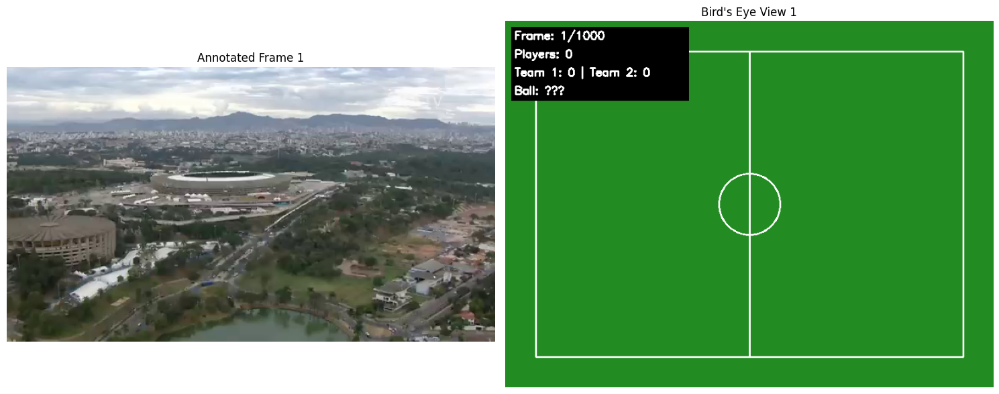

Progress: 5.1% - Frame 51


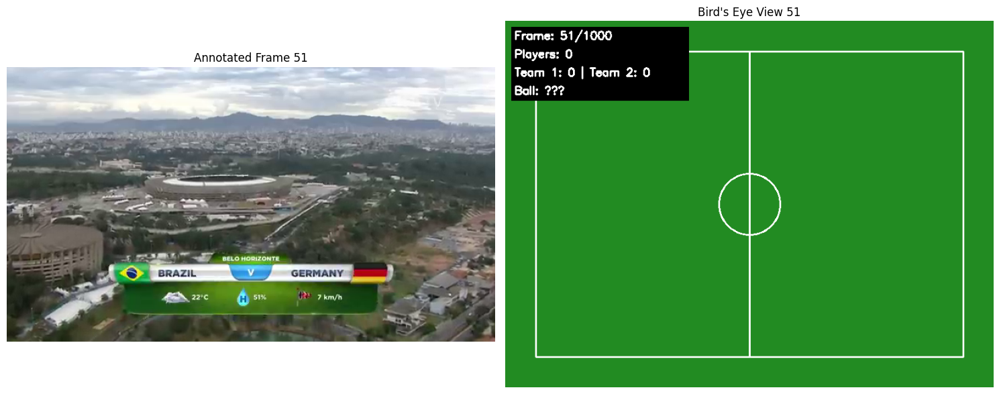

Progress: 10.1% - Frame 101


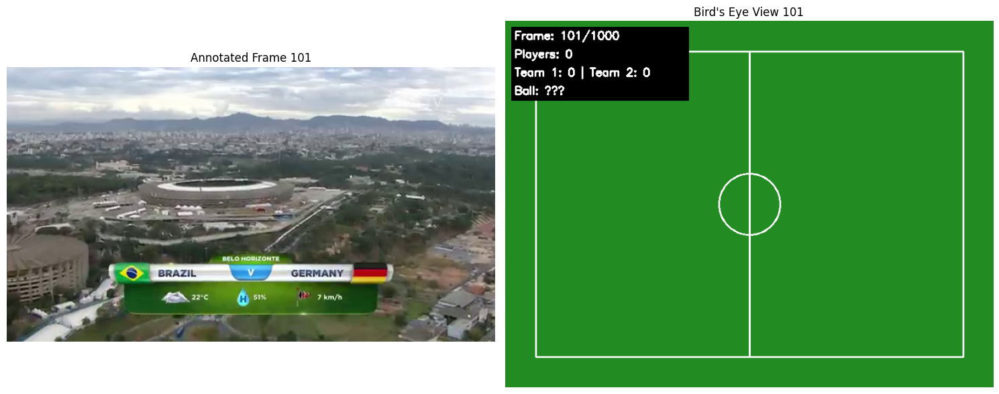

Progress: 15.1% - Frame 151


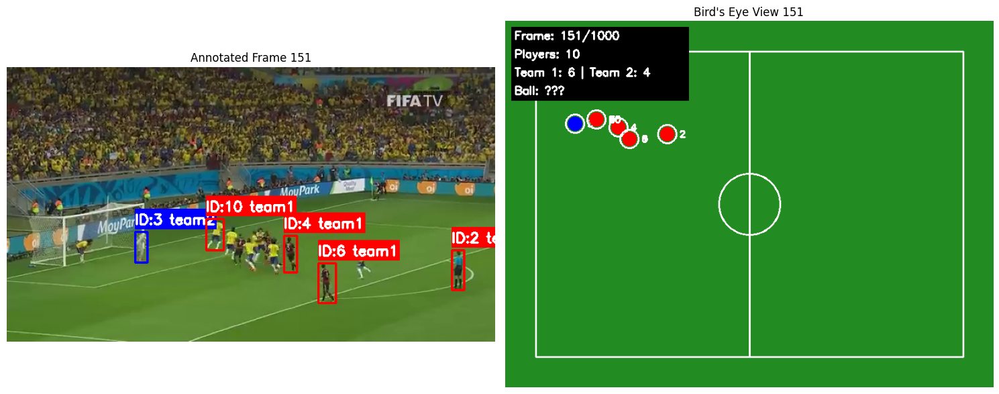

Progress: 20.1% - Frame 201


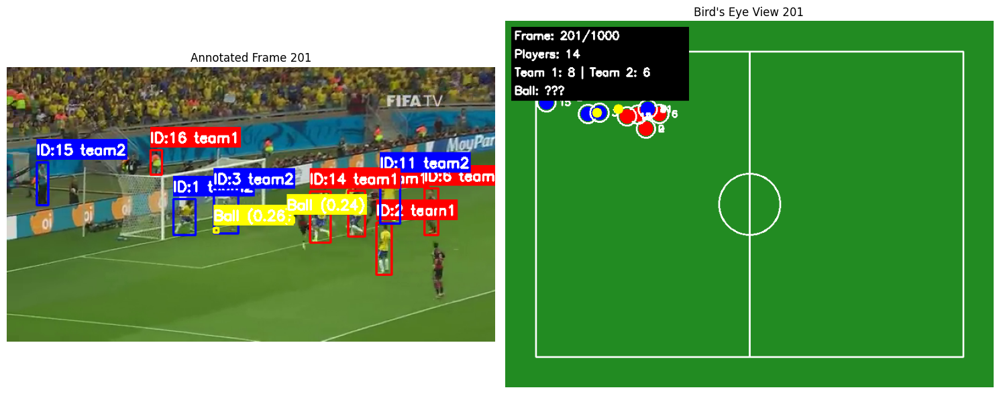

Progress: 25.1% - Frame 251


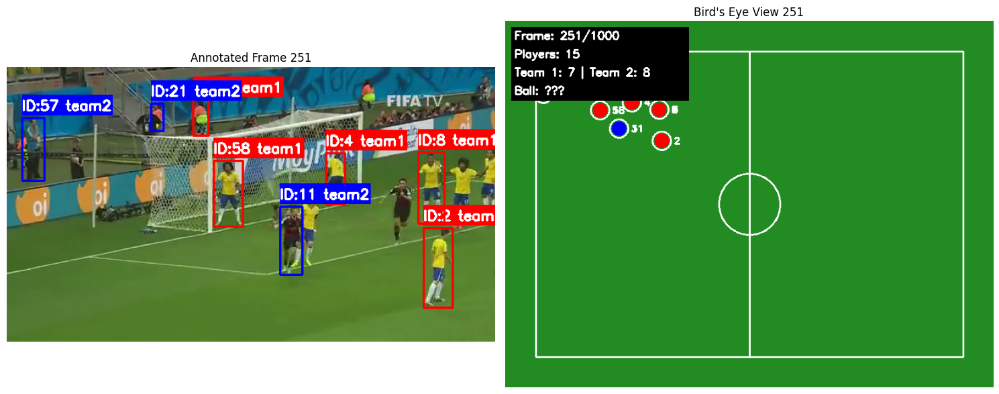

Progress: 30.1% - Frame 301


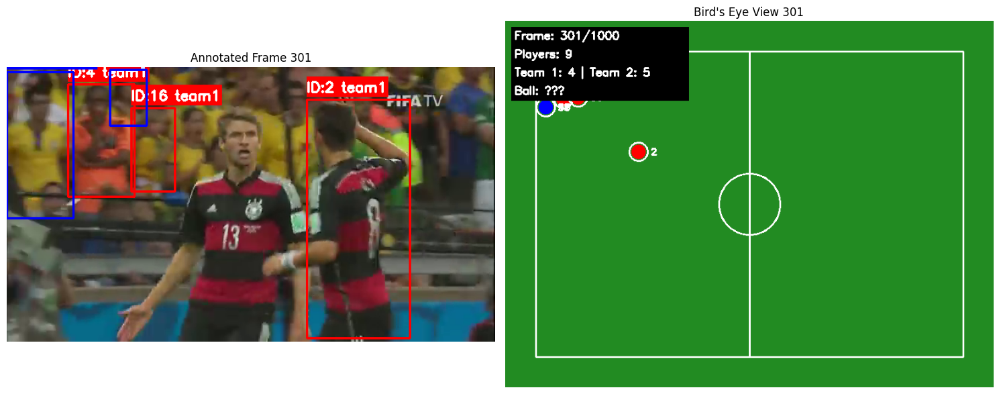

Progress: 35.1% - Frame 351


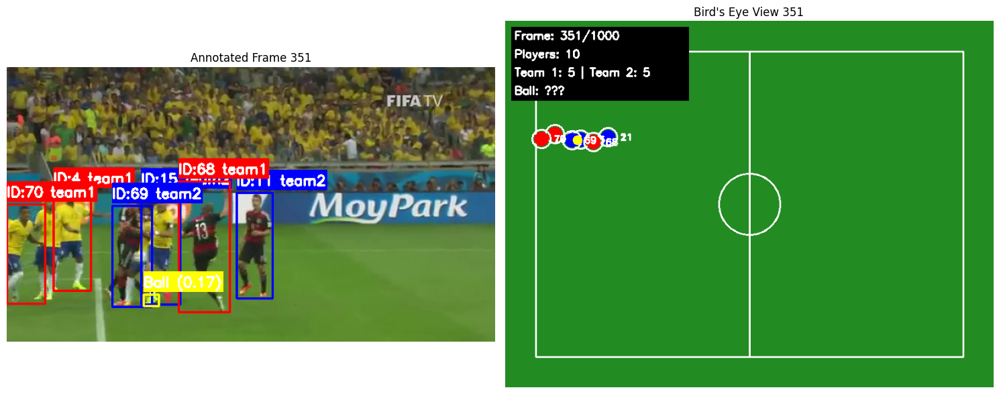

Progress: 40.1% - Frame 401


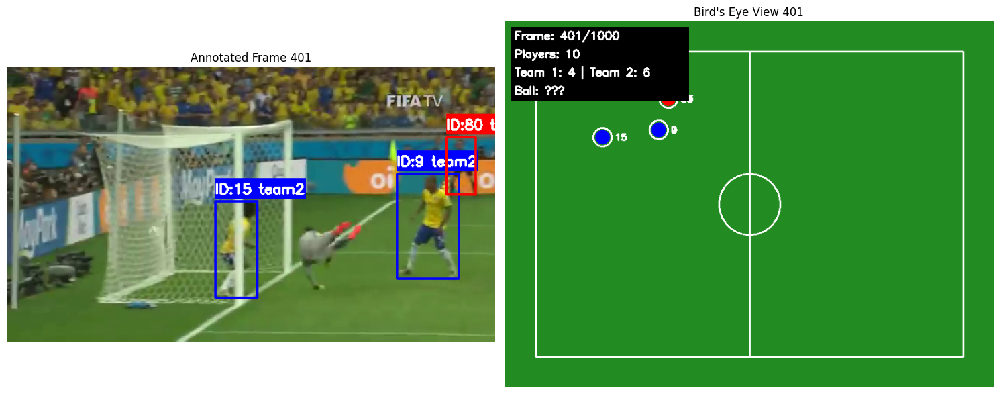

Progress: 45.1% - Frame 451


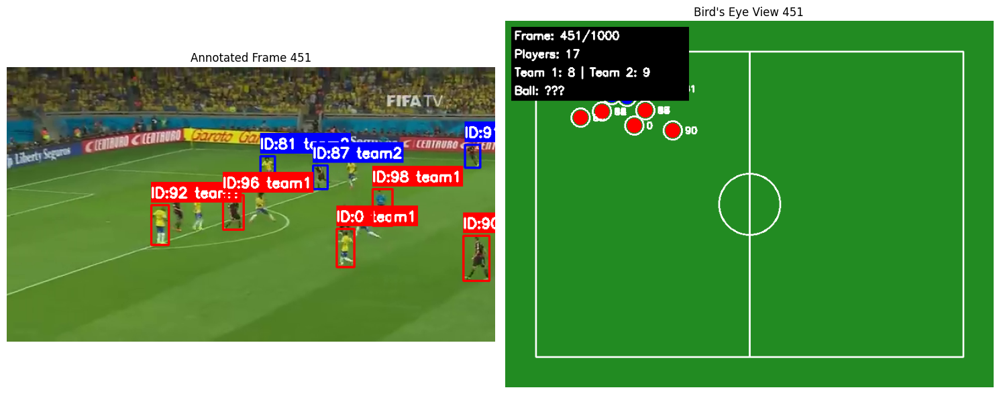

Progress: 50.1% - Frame 501


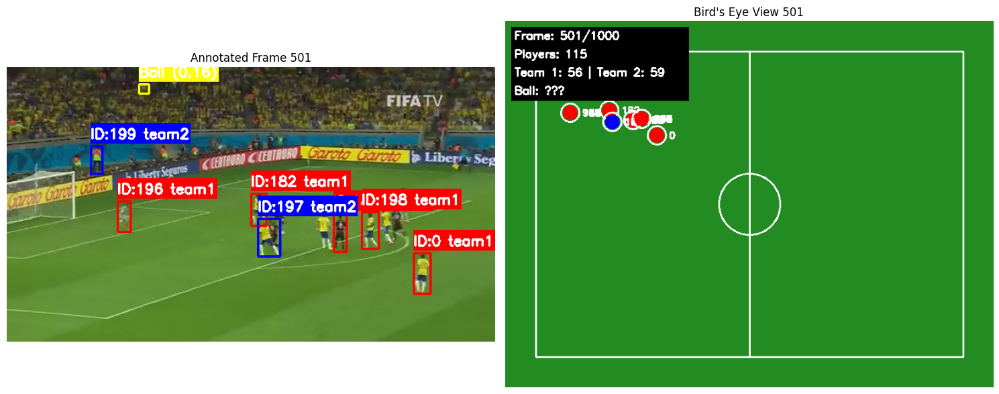

Progress: 55.1% - Frame 551


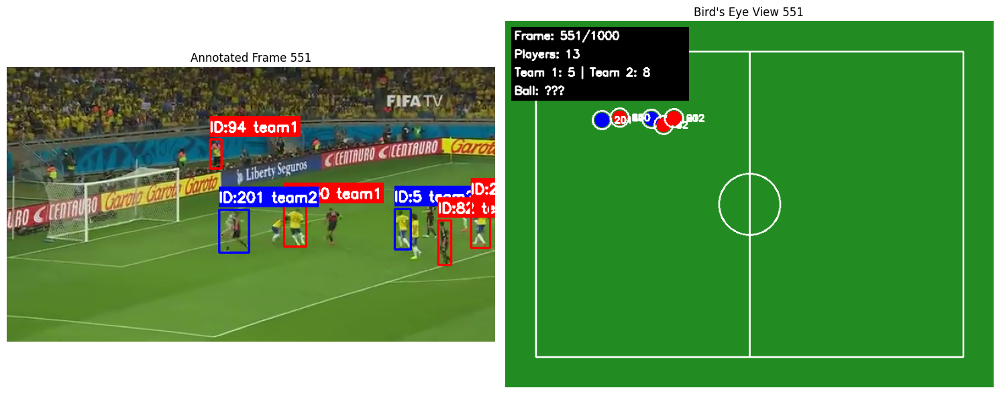

Progress: 60.1% - Frame 601


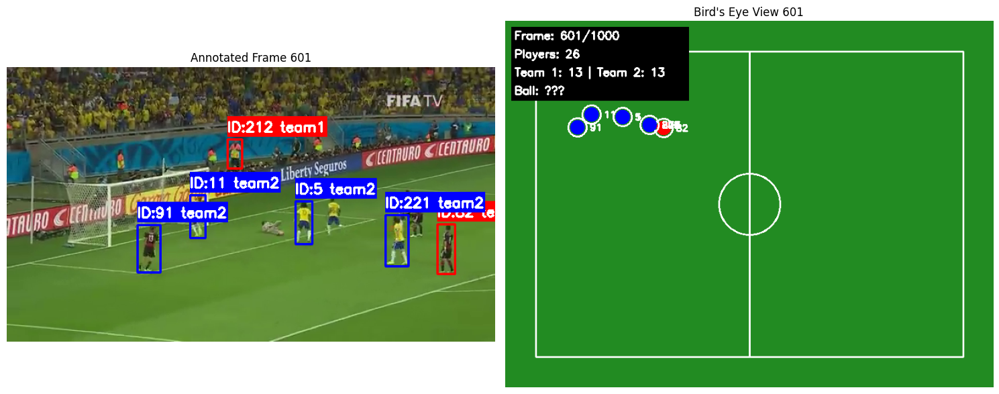

Progress: 65.1% - Frame 651


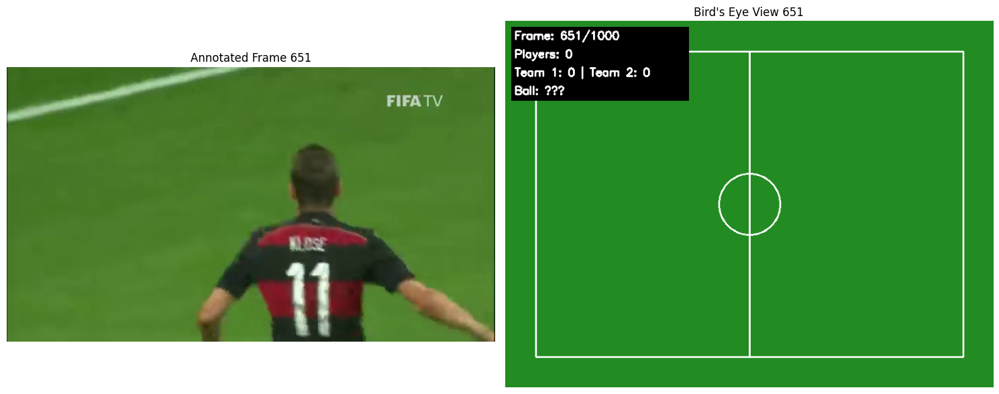

Progress: 70.1% - Frame 701


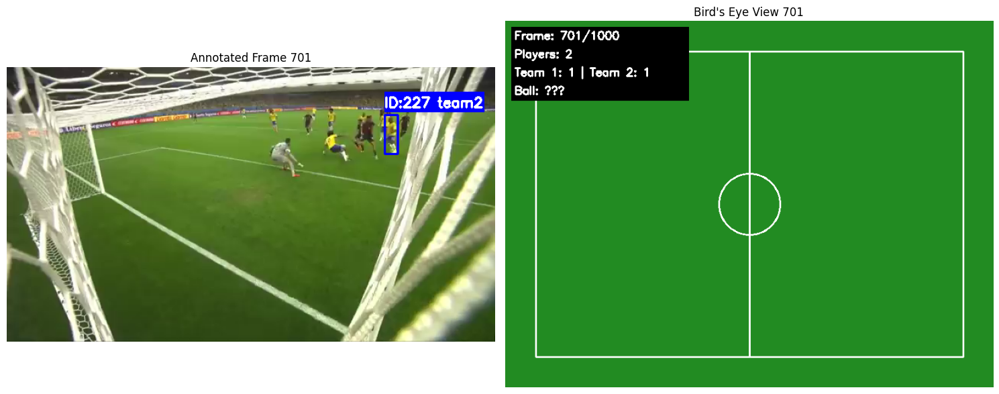

Progress: 75.1% - Frame 751


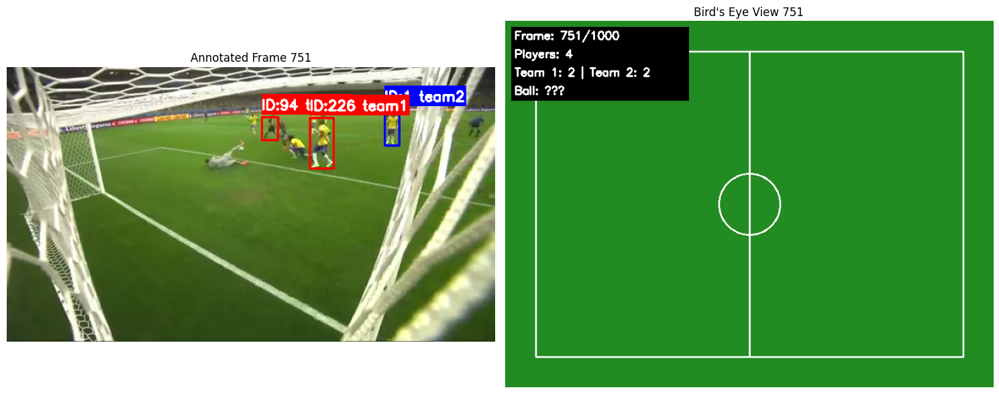

Progress: 80.1% - Frame 801


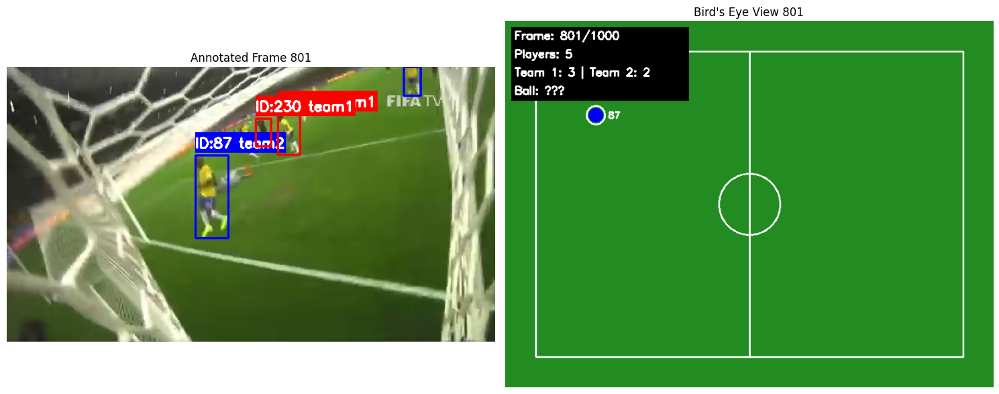

Progress: 85.1% - Frame 851


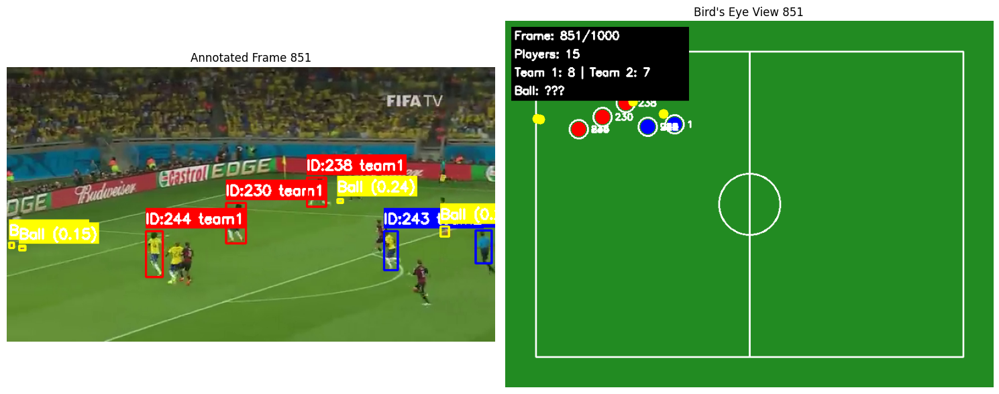

Progress: 90.1% - Frame 901


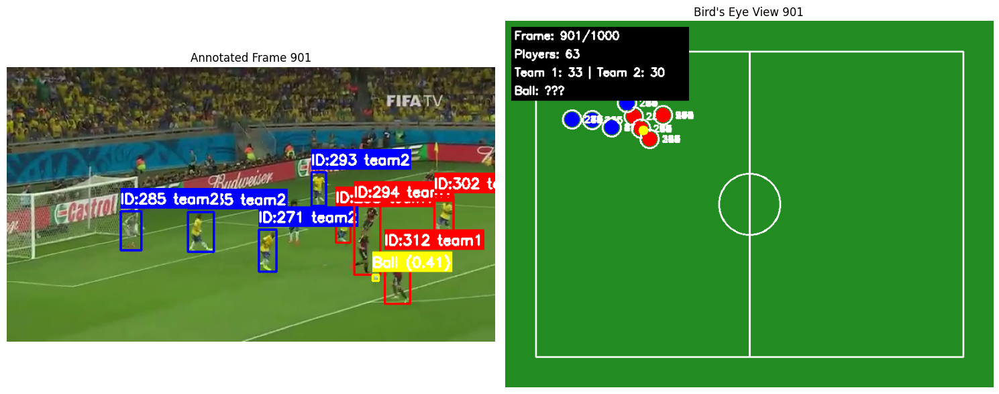

Progress: 95.1% - Frame 951


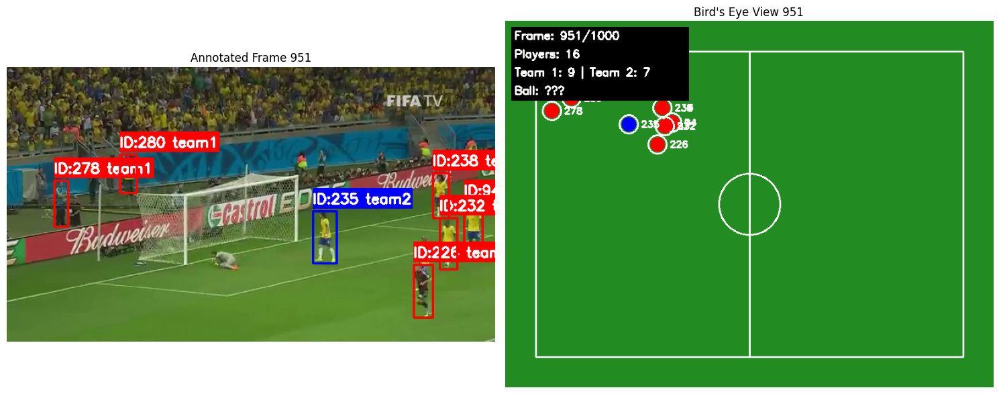

🗑️ Cleaned up downloaded file: ./a7IMPsyQg6k.mp4
✅ Processing complete! Processed 1000 frames
📁 Output saved: fixed_analysis_output.mp4
✅ Analysis completed successfully!


In [26]:
run_fixed_analysis()